In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [23]:
data = pd.read_excel('train.xlsx')
data.head()

,Date,Cloud coverage,Visibility,Temperature,Dew point,Relative humidity,Wind speed,Station pressure,Altimeter,Solar energy,(Inverters)
0,2016-02-01,0.10,9.45,3.11,0.32,79.46,4.70,29.23,30.02,20256,NaN
1,2016-02-02,0.80,3.94,6.99,6.22,93.60,13.29,28.91,29.70,1761,NaN
2,2016-02-03,0.87,8.70,1.62,0.02,85.00,16.73,29.03,29.82,2775,NaN
3,2016-02-04,0.37,10.00,-2.47,-5.89,74.52,9.46,29.46,30.26,28695,NaN
4,2016-02-05,0.52,9.21,-2.00,-4.15,82.03,5.92,29.55,30.35,9517,NaN


In [24]:
data.max()

Date                 2017-10-29 00:00:00
Cloud coverage                         1
Visibility                            10
Temperature                        28.18
Dew point                          25.02
Relative humidity                  97.85
Wind speed                         24.83
Station pressure                   29.87
Altimeter                          30.67
Solar energy                       40245
(Inverters)                          NaN
dtype: object

In [25]:
list(data.min())

[Timestamp('2016-02-01 00:00:00'),
 0.0,
 1.15,
 -16.06,
 -18.72,
 21.25,
 1.03,
 8.59,
 29.48,
 580,
 nan]

In [26]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 637 entries, 0 to 636
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               637 non-null    datetime64[ns]
 1   Cloud coverage     637 non-null    float64       
 2   Visibility         637 non-null    float64       
 3   Temperature        637 non-null    float64       
 4   Dew point          637 non-null    float64       
 5   Relative humidity  637 non-null    float64       
 6   Wind speed         637 non-null    float64       
 7   Station pressure   637 non-null    float64       
 8   Altimeter          637 non-null    float64       
 9   Solar energy       637 non-null    int64         
 10  (Inverters)        0 non-null      float64       
dtypes: datetime64[ns](1), float64(9), int64(1)
memory usage: 54.9 KB


In [27]:
data.drop('(Inverters)', inplace=True, axis=1)

### Date and time analysis

In [28]:
def cvtDate(date):
    #form -> year-month-day
    year, month, day = tuple(str(date).split('-'))
    
    year = int(year)
    month = int(month)
    day = day[:2]
    day = int(day)
    
    return (year, month, day)

def transDateCol(dataset):
    dates = list(dataset['Date'])
    
    years = []
    months = []
    days = []
    
    for date in dates:
        year, month, day = cvtDate(date)
        years.append(year)
        months.append(month)
        days.append(day)
    
    dataset['year'] = years
    dataset['month'] = months
    dataset['day'] = days
    
    return dataset

udata = transDateCol(data)

In [29]:
data.drop('Date', inplace=True, axis=1)

Positive Correlation:
1. Temperature and dew point
2. Relative humidity and cloud coverage
3. visibility and solar energy
4. temperature and solar energy

Negative Correlation:
1. visibility and cloud coverage
2. Relative humidity and visibility
3. Cloud coverage and solar energy
4. Relative humidity and solar energy

In [30]:
def trainLR(data, labels):
    return LinearRegression().fit(data, labels)

def trainDT(data, labels, params):
    params['random_state'] = 0
    return DecisionTreeRegressor(**params).fit(data, labels)

In [31]:
def sepTarget(data):
    labels = list(data['Solar energy'])
    data.drop('Solar energy', inplace=True, axis=1)
    return data, labels

def featureScaling(train, test):
    scaler = MinMaxScaler()
    scaler = scaler.fit(train)
    strain = scaler.transform(train)
    stest = scaler.transform(test)
    strain = pd.DataFrame(strain, columns=list(train.columns))
    stest = pd.DataFrame(stest, columns=list(test.columns))
    return strain, stest

def getModel(data, labels, model, params={}):
    if model == 'lr':
        return trainLR(data, labels)
    elif model == 'dt':
        return trainDT(data, labels, params)
    else:
        raise Exception("Choose a different model : [linear regression, decision tree]")
    
def printMetrics(preds, labels):
    print('Mean Squared Error : ', mean_squared_error(preds, labels))
    print('Mean Absolute Error : ', mean_absolute_error(preds, labels))
    print('R2 Error : ', r2_score(preds, labels))

In [32]:
train = udata.sample(frac=1).reset_index(drop=True)

train, test = train_test_split(train, test_size=0.30, random_state=0)
train.shape, test.shape

((445, 12), (192, 12))

# Linear Regression

### All features

In [33]:
train

,Cloud coverage,Visibility,Temperature,Dew point,Relative humidity,Wind speed,Station pressure,Altimeter,Solar energy,year,month,day
0,0.00,10.00,8.53,4.67,72.21,11.00,29.35,30.14,25838,2016,11,10
404,0.21,10.00,27.68,19.41,59.40,9.76,29.22,30.01,32494,2016,6,11
71,0.80,7.48,14.74,12.28,85.99,5.99,29.07,29.86,14840,2016,4,28
263,0.35,10.00,16.57,9.88,63.17,11.42,29.15,29.94,33975,2017,9,5
102,0.13,10.00,17.48,10.21,63.55,4.39,29.41,30.21,33204,2017,9,8
...,...,...,...,...,...,...,...,...,...,...,...,...
9,0.08,10.00,19.82,14.54,67.13,8.87,29.30,30.09,37640,2017,7,29
359,0.35,10.00,23.19,19.29,76.50,14.17,29.17,29.96,22141,2016,5,28
192,0.80,9.38,1.19,-1.66,80.88,14.03,29.07,29.86,4046,2016,3,1
629,0.45,9.65,24.77,22.73,84.93,8.06,29.14,29.93,14309,2017,7,11


In [33]:
test

,Cloud coverage,Visibility,Temperature,Dew point,Relative humidity,Wind speed,Station pressure,Altimeter,Solar energy,year,month,day
453,0.18,9.90,12.14,6.82,68.23,5.91,29.32,30.11,30854,2016,4,23
482,0.44,10.00,17.50,10.45,65.60,8.39,29.42,30.22,24473,2017,4,13
516,0.73,10.00,4.81,-0.33,70.16,13.79,29.34,30.14,22913,2016,4,4
542,0.39,9.70,20.90,16.36,77.64,15.08,28.92,29.71,19562,2017,10,7
85,0.98,9.47,12.70,11.08,86.67,9.75,29.30,30.09,6859,2016,10,20
...,...,...,...,...,...,...,...,...,...,...,...,...
475,0.00,8.94,8.02,5.16,80.66,7.09,29.50,30.30,26187,2016,3,11
301,0.11,10.00,21.18,16.32,72.06,4.07,29.33,30.12,35804,2016,7,16
107,0.51,9.23,23.32,18.60,76.60,8.20,28.97,29.76,7070,2017,6,23
606,0.00,10.00,20.78,6.85,41.77,6.29,29.20,29.99,35004,2016,5,23


In [12]:
train, tlabels = sepTarget(train)
test, targets = sepTarget(test)

scaled_train, scaled_test = featureScaling(train, test)

lr_model = getModel(scaled_train , tlabels, 'lr')
scaled_train


,Cloud coverage,Visibility,Temperature,Dew point,Relative humidity,Wind speed,Station pressure,Altimeter,year,month,day
0,0.03,0.915375,0.931986,0.921010,0.760733,0.138021,0.972274,0.504202,1.0,0.545455,0.133333
1,0.62,0.480334,0.898692,0.943678,0.889398,0.095920,0.973684,0.529412,0.0,0.636364,0.533333
2,0.31,0.995232,0.800000,0.590792,0.317539,0.395833,0.874530,0.428571,1.0,0.363636,0.966667
3,0.01,1.000000,0.343639,0.298201,0.584162,0.394097,0.964756,0.361345,1.0,0.090909,0.466667
4,0.00,1.000000,0.331986,0.351951,0.756283,0.341146,0.977444,0.588235,0.0,1.000000,0.866667
...,...,...,...,...,...,...,...,...,...,...,...
440,0.00,0.990465,0.740785,0.655527,0.607853,0.201389,0.976034,0.571429,1.0,0.818182,0.633333
441,0.35,1.000000,0.824257,0.770741,0.624738,0.426215,0.957237,0.226891,0.0,0.454545,0.133333
442,0.48,1.000000,0.372652,0.366207,0.688089,0.700955,0.967575,0.411765,0.0,1.000000,0.933333
443,0.45,0.958284,0.918906,0.946483,0.833508,0.272135,0.965695,0.378151,1.0,0.545455,0.333333


In [ ]:
import pickle

In [ ]:
model = pickle.load(open('model.pkl','rb'))

In [ ]:
arr = list([[0.92,9.44,14.09	,12.01	,82.24	,11.20	,28.02,	29.51,	8730,	2017	,4	]])
model.predict(arr)[0]

### Remove Dew Point -> High correlation with the temperature.

In [81]:
train = udata.sample(frac=1).reset_index(drop=True)

train.drop('Dew point', inplace=True, axis=1)

train, test = train_test_split(train, test_size=0.30, random_state=0)
train.shape, test.shape

((445, 11), (192, 11))

In [83]:
train, tlabels = sepTarget(train)
test, targets = sepTarget(test)

scaled_train, scaled_test = featureScaling(train, test)

lr_model = getModel(scaled_train, tlabels, 'lr')

printMetrics(lr_model.predict(scaled_test), targets)

Mean Squared Error :  48485016.663977236
Mean Absolute Error :  5371.919957217601
R2 Error :  0.2803113717436051


### Remove Date features -> less correlation

In [85]:
train = udata.sample(frac=1).reset_index(drop=True)

train.drop(['year', 'month', 'day'], inplace=True, axis=1)

train, test = train_test_split(train, test_size=0.30, random_state=0)
train.shape, test.shape

((445, 9), (192, 9))

In [87]:
train, tlabels = sepTarget(train)
test, targets = sepTarget(test)

scaled_train, scaled_test = featureScaling(train, test)

lr_model = getModel(scaled_train, tlabels, 'lr')

printMetrics(lr_model.predict(scaled_test), targets)

KeyError: 'Solar energy'

# Decision Tree

### All features

In [58]:
train = udata.sample(frac=1).reset_index(drop=True)

train, test = train_test_split(train, test_size=0.30, random_state=0)

train, tlabels = sepTarget(train)
test, targets = sepTarget(test)

params = {'max_depth' : 10}
dt_model = getModel(train, tlabels, 'dt', params)

printMetrics(dt_model.predict(test), targets)

Mean Squared Error :  77496284.84087761
Mean Absolute Error :  6487.513317888709
R2 Error :  0.2650239780004331


In [60]:
dt_model.feature_importances_

array([0.57346854, 0.01832327, 0.07871868, 0.03063884, 0.0868979 ,
       0.03883547, 0.06185243, 0.03046523, 0.00894346, 0.04319281,
       0.02866336])

# 02-04-2021

1. Outliers

In [62]:
data.describe()

,Cloud coverage,Visibility,Temperature,Dew point,Relative humidity,Wind speed,Station pressure,Altimeter,Solar energy,year,month,day
count,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000
mean,0.383265,9.138352,14.203422,9.623626,72.416876,8.631570,28.592716,30.022936,21521.733124,2016.474097,6.299843,15.678179
std,0.313215,1.416155,9.484552,9.334436,13.711642,4.082689,2.683527,0.187608,10843.988912,0.499721,3.113606,8.778102
min,0.000000,1.150000,-16.060000,-18.720000,21.250000,1.030000,8.590000,29.480000,580.000000,2016.000000,1.000000,1.000000
25%,0.120000,8.840000,7.360000,3.220000,65.310000,5.670000,29.060000,29.910000,12268.000000,2016.000000,4.000000,8.000000
50%,0.320000,9.850000,16.260000,10.800000,73.690000,8.170000,29.200000,30.030000,23094.000000,2016.000000,6.000000,16.000000
75%,0.620000,10.000000,22.340000,17.330000,82.330000,10.910000,29.310000,30.130000,30307.000000,2017.000000,9.000000,23.000000
max,1.000000,10.000000,28.180000,25.020000,97.850000,24.830000,29.870000,30.670000,40245.000000,2017.000000,12.000000,31.000000


## Skewness in the data.

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Visibility'>

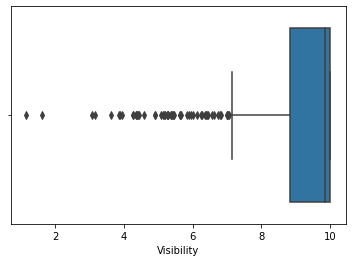

In [64]:
sns.boxplot(data['Visibility']) #left skew.

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Relative humidity'>

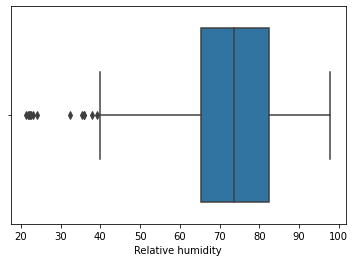

In [66]:
sns.boxplot(data['Relative humidity'])    #left skew.

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Station pressure'>

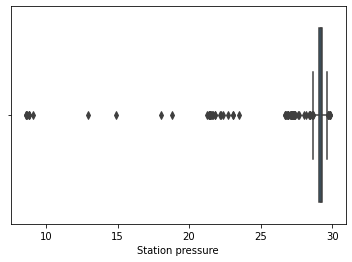

In [68]:
sns.boxplot(data['Station pressure'])  #left skew.

### We simply cannot drop an outlier unless it was a typo, or if its not adding any value to model just affecting the analysis, or if its the decider for correlation between twl variables.

https://www.theanalysisfactor.com/outliers-to-drop-or-not-to-drop/#:~:text=One%20option%20is%20to%20try,to%20try%20a%20different%20model.

https://machinelearningmastery.com/power-transforms-with-scikit-learn/

In [70]:
from sklearn.preprocessing import PowerTransformer
import statsmodels.api as sm

In [72]:
power = PowerTransformer(method='yeo-johnson', standardize=True)

In [74]:
temp, tar = sepTarget(udata.copy())
trans = power.fit_transform(temp) #to remove the skewness as much as possible.

In [76]:
nData = pd.DataFrame(trans, columns=temp.columns)
nData['Solar energy'] = tar

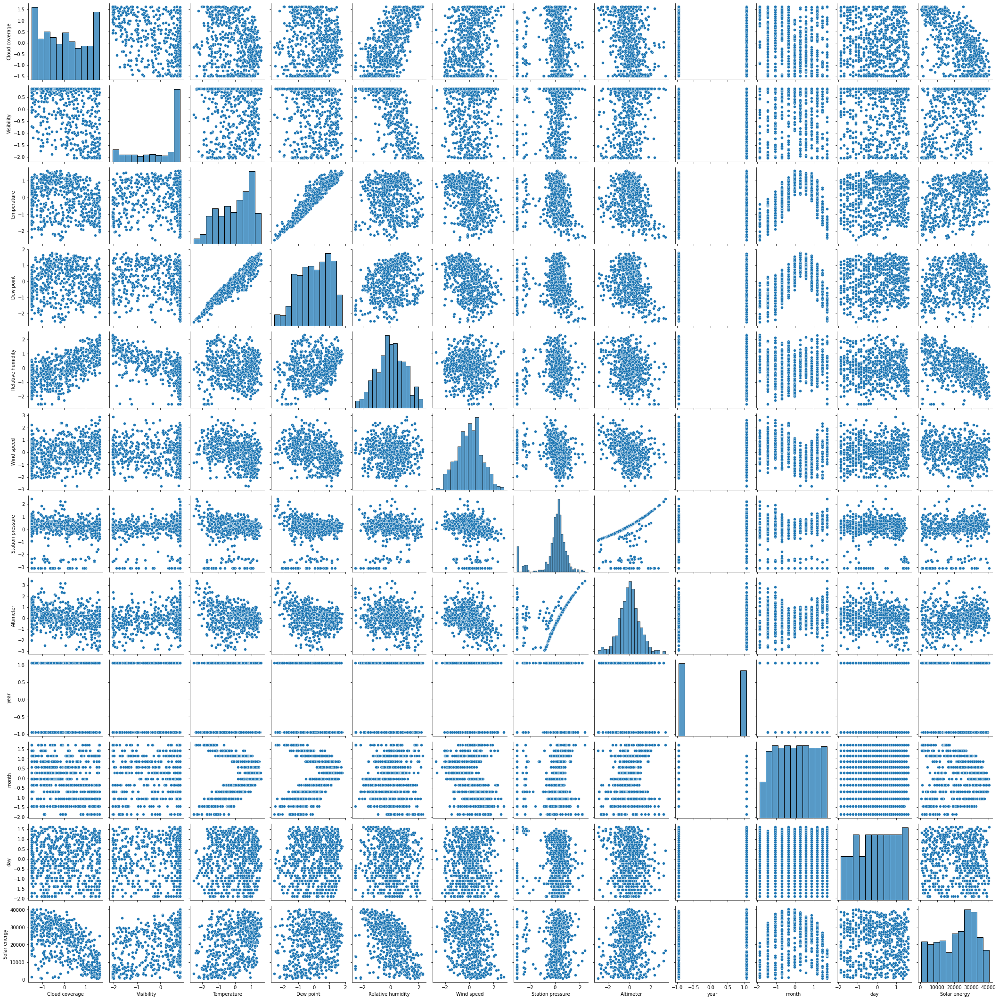

In [78]:
sns.pairplot(nData)

<AxesSubplot:>

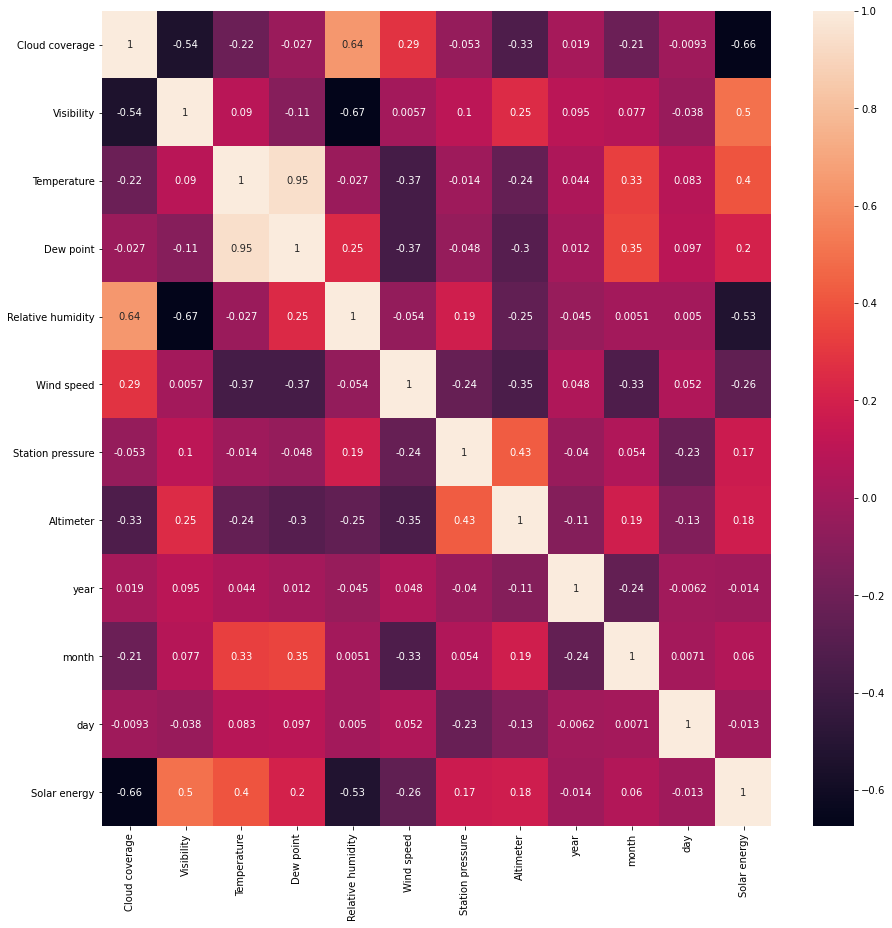

In [80]:
plt.figure(figsize=(15, 15))
sns.heatmap(nData.corr(), annot=True) #pearson correlation

In [82]:
train = nData.sample(frac=1).reset_index(drop=True).copy()
train.drop(['Visibility', 'Altimeter', 'Wind speed', 'Relative humidity', 'day'], inplace=True, axis=1)

train, test = train_test_split(train, test_size=0.3, random_state=0)
train.shape, test.shape

((445, 7), (192, 7))

In [84]:
train.head()

,Cloud coverage,Temperature,Dew point,Station pressure,year,month
0,0.363033,0.445573,0.351349,-0.258621,1.053218,1.157291
404,0.729377,1.227869,1.444848,0.781464,-0.949471,0.281847
71,1.231023,0.275804,0.351349,0.444204,-0.949471,1.157291
263,1.439380,-0.407334,-0.370094,0.364394,1.053218,-1.056018
102,0.879249,-0.317230,-0.024984,-0.427586,1.053218,-1.443732


In [86]:
train, tlabels = sepTarget(train)
test, targets = sepTarget(test)

#scaled_train, scaled_test = featureScaling(train, test)
scaled_train = train
scaled_test = test

lr_model = getModel(scaled_train, tlabels, 'lr')

printMetrics(lr_model.predict(scaled_test), targets)

Mean Squared Error :  44365438.20788587
Mean Absolute Error :  5178.488359053477
R2 Error :  0.3331680083475632


In [21]:
import numpy as np

In [ ]:
X_train = sm.add_constant(train) # adding a constant
model = sm.OLS(tlabels,train)
results = model.fit()
summary = results.summary()
print(summary)

In [23]:
Xmax = [1.0,10.0,28.18,25.02,97.85,24.83,29.87,30.67,2017,12,31]
Xmin = [0.0,1.15,-16.06,-18.72,21.25,1.03,8.59,29.48,2016,1,1]
X = [0.03,9.29,25.32,21.64,79.37,4.97,29.28,30.08,2017,7,5]
XN= [x-xmn for x, xmn in zip(X, Xmin)]
XD = [xmx-xmn for xmx, xmn in zip(Xmax, Xmin)]
Xsc =  [xn / xd for xn, xd in zip(XN, XD)]
Xsc

[0.03,
 0.9197740112994349,
 0.9353526220614828,
 0.9227251943301327,
 0.7587467362924283,
 0.16554621848739495,
 0.9722744360902256,
 0.5042016806722666,
 1.0,
 0.5454545454545454,
 0.13333333333333333]

In [27]:
Xmax = [1.0,10.0,28.18,25.02,97.85,24.83,29.87,30.67,2017,12,31]
Xmin = [0.0,1.15,-16.06,-18.72,21.25,1.03,8.59,29.48,2016,1,1]
X = [0.03,9.29,25.32,21.64,79.37,4.97,29.28,30.08,2017,7,5]
XN= list(np.array(X) - np.array(Xmin))
XD = list(np.array(Xmax) - np.array(Xmin))
Xsc =  [xn / xd for xn, xd in zip(XN, XD)]
round_to_tenths = [round(num, 6) for num in Xsc]
round_to_tenths

[0.03,
 0.919774,
 0.935353,
 0.922725,
 0.758747,
 0.165546,
 0.972274,
 0.504202,
 1.0,
 0.545455,
 0.133333]

In [ ]:
0.03	0.915375	0.931986	0.921010	0.760733	0.138021	0.972274	0.504202	1.0	0.545455	0.133333